## 14.Interactive plots -- Plot.ly

This notebook gives a quick overview of an convienient web-enabled interactive plotting library, called **Plotly**.

It's interface is much like matplotlib.  So let's start by converting one of our matplotlib plots to a plotly plot.

Below is a plot from Notebook 13. 

datlib cwd /home/user/mp248-course-notes


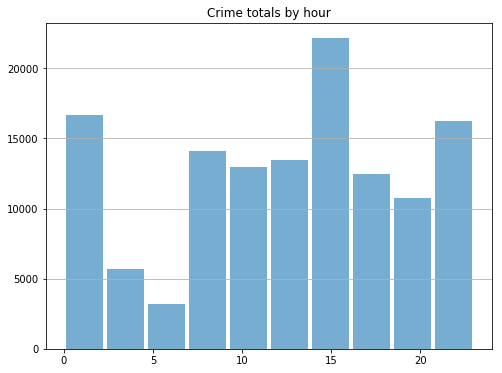

In [1]:
from Quizzes_Assignments_Exams.datlib import *
import matplotlib.pyplot as plt
%matplotlib inline

## here is a matplotlib plot from Monday's class
plt.figure(figsize=(8,6))
HOD = [x['incident_datetime'].hour for x in clean_dat]
plt.title('Crime totals by hour')
plt.grid(axis='y')
A = plt.hist(HOD, alpha=0.6, rwidth=0.9)

In [2]:
## let's redo it in plotly

import plotly as py
import plotly.graph_objs as go
## not upload to web
py.offline.init_notebook_mode()

#HOD = [x['incident_datetime'].hour for x in clean_dat]
data_hist = [go.Histogram(x=HOD, opacity=0.6, name='totals')]
Layout = go.Layout(
    title='Crimes by hour',
    xaxis=dict( title='Hour of day' ),
    yaxis=dict( title='Count'),
    bargap=0.1)
fig = go.Figure(data=data_hist, layout=Layout)

py.offline.iplot(fig)

[https://plot.ly/feed/#/]

In [3]:
import pprint as pp
pp.pprint(ctree)

{'Alarm': defaultdict(<class 'int'>, {'FALSE ALARMS': 1447}),
 'Arson': defaultdict(<class 'int'>,
                      {'ARSON-DISREGARD FOR HUMAN LIFE': 22,
                       'ARSON-PROPERTY': 260}),
 'Assault': defaultdict(<class 'int'>,
                        {'ASSAULT AGAINST POLICE OFFICER': 417,
                         'ASSAULT-COMMON OR TRESPASS': 2065,
                         'ASSAULTS-OTHER': 473}),
 'Assault with Deadly Weapon': defaultdict(<class 'int'>,
                                           {'ASSAULT OT P/O-W/WPN OR CBH': 38,
                                            'ASSAULT POLICE-W/WEAPON OR CBH': 75,
                                            'ASSAULT-AGGRAVATED': 98,
                                            'ASSAULT-OTHER PEACE OFFICER': 125,
                                            'ASSAULT-W/WEAPON OR CBH': 1552}),
 'Breaking & Entering': defaultdict(<class 'int'>,
                                    {'BREAK & ENTER-BUSINESS': 1691,
          

In [4]:
## spatial plot of crimes
ctypes = ['ASSAULT AGAINST POLICE OFFICER',\
          'LIQUOR-INTOX IN PUBLIC PLACE']

data = [ go.Scatter(\
         y=[x['latitude'] for x in clean_dat if\
            x['incident_type_primary']==ctype],
         x=[x['longitude'] for x in clean_dat if\
            x['incident_type_primary']==ctype],
         mode='markers',
         text=ctype
          ) for ctype in ctypes]

layout = go.Layout( autosize=True, hovermode='closest')
fig=go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

In [6]:
import token_file

## plot the crimes on a map
ctypes = ['ASSAULT AGAINST POLICE OFFICER',\
          'LIQUOR-INTOX IN PUBLIC PLACE']

data = [ go.Scattermapbox(\
         lat=[x['latitude'] for x in clean_dat if\
            x['incident_type_primary']==ctype],
         lon=[x['longitude'] for x in clean_dat if\
            x['incident_type_primary']==ctype],
         mode='markers',
         text=ctype ) for ctype in ctypes]

layout = go.Layout( autosize=True, hovermode='closest',
                    mapbox=go.layout.Mapbox(\
                     accesstoken=token_file.accesstoken,
                     center=go.layout.mapbox.Center( lat=48.4234, lon=-123.3646),
                     zoom=11
                    ))

fig=go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

## Other standard plotly plots

[Pie charts](https://plot.ly/python/pie-charts/)

[Misc. Examples](https://plot.ly/python/)

* * *

## 3d interactive plots

We give a standard plot of something called a $(p,q)$-torus knot.

* * *

In [ ]:
from data import torus_loader
xyz = torus_loader.torus_dat(7,3)


FloatProgress(value=0.0, description='Knot data')

In [19]:
print(type(xyz))
print(xyz.shape)
## three 2-dimension grids for the x, y, z coords
## of points on a surface
seg = xyz.shape[0]-1
segm = xyz.shape[1]-1
MI = int(0.2*(segm+1))
x=xyz[:,:,0]
y=xyz[:,:,1]
z=xyz[:,:,2]
print(x.shape)

<class 'numpy.ndarray'>
(901, 41, 3)
(901, 41)


In [20]:
surface1 = go.Surface(x=x[0:seg+1,0:MI+1], y=y[0:seg+1,0:MI+1], z=z[0:seg+1,0:MI+1],
                      colorscale=[[0.0, 'darkred'], [1.0, 'red']])
surface2 = go.Surface(x=x[0:seg+1,MI:segm+1],\
                      y=y[0:seg+1,MI:segm+1],\
                      z=z[0:seg+1,MI:segm+1],\
                      colorscale=[[0.0, 'gold'], [1.0, 'orange']])
fig = go.Figure(data=[surface1, surface2])
py.offline.iplot(fig)

In [1]:
def redoa4(beta3,m):
    ##a.4
#100OLS
    def geta4xy(seeds,I):
        np.random.seed(seeds);I=100
        n1 = getn(0,2);n2 = getn(0,2);n3=getn(0,2)
        beta2=1;xa3 = beta2*n1 + n2
        beta0=0;beta1 = 1
        ya3 = beta0 + beta1*xa3 + n1
        x1 = []
        for i in xa3:
            x1.append(float(i))
        x = np.array(x1)
        y1=[]
        for j in ya3:
            y1.append((float(j)))
        y=np.array(y1)
    return x,y
    beta1est_list = [];beta0est_list=[]
    seeds=0;I=100
    for i in range(100):
        seeds=0
        seeds= seeds + i
        xa2,ya2 = geta4xy(seeds,I)
        beta1est_list.append(getest(xa2,ya2)[0]);beta0est_list.append(getest(xa2,ya2)[1])
    close(m+5);figure(m+5);
    a21=hist(beta1est_list)
    plt.title('beta1est using OLs')
    print('its variance is ',np.var(beta1est_list))
    ##commit is that the beta1est is distributed centered at 1.5 and the variance is very small
    
    def geta4x_y(seeds,I):
    np.random.seed(seeds);I=100
    n1 = getn(0,2);n2 = getn(0,2);n3=getn(0,2)
    beta2=1;xa3 = beta2*n1 + n2
    beta0=0;beta1 = 1
    ya3 = beta0 + beta1*xa3 + n1
    
    za3 = beta3*n2 + n3
    xa3_ = getest(za3,xa3)[0]*za3 + getest(za3,xa3)[1]
    
    x1 = []
    for i in xa3_:
        x1.append(float(i))
    x = np.array(x1)
    y1=[]
    for j in ya3:
        y1.append((float(j)))
    y=np.array(y1)
    return x,y
    
    beta1est_list = [];beta0est_list=[]
    seeds=0;I=100
    for i in range(100):
        seeds=0
        seeds= seeds + i
        xa2,ya2 = geta4x_y(seeds,I)
        beta1est_list.append(getest(xa2,ya2)[0]);beta0est_list.append(getest(xa2,ya2)[1])

    close(6+m);figure(6+m);
    a21=hist(beta1est_list)
    plt.title('beta1est')
    print('its variance is ',np.var(beta1est_list))
    ##commit is that the beta1est is distributed centered at 1.5 and the variance is very small
    print('skewness',scipy.stats.skew(beta1est_list))

